In [1]:
from discover_lora_vae.models import LoraVAE
import diffusers
import torch
from tqdm import tqdm 
from common.utils import make_weight_vector, recover_lora, convert_to_multi
from PIL import Image
import matplotlib.pyplot as plt
from common.utils import augmentations

lora_vae = LoraVAE(
    data_dim=1_365_504,
    model_dim=512,
    ff_mult=3.0,
    chunks=1,
    encoder_layers=20,
    decoder_layers=20
)

state_dict = torch.load('/home/ubuntu/auto_lora_discovery/checkpoint-vae-60000')
lora_vae.load_state_dict(state_dict)
lora_vae = lora_vae.cuda().to(torch.float16)

/home/ubuntu/miniconda3/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
lora_path = "/home/ubuntu/AutoLoRADiscovery/common/lora_outputs/lora-Mike Tyson/lora_layers_new.pth"
orig_state_dict = torch.load(lora_path, map_location='cpu')

In [3]:
orig_state_dict = convert_to_multi(orig_state_dict, 0)

In [4]:
orig_lora_vec, weight_dict = make_weight_vector(orig_state_dict)
orig_lora_vec = (orig_lora_vec).unsqueeze(0).cuda().to(torch.float16)

In [60]:
lora_bundle_path = "/home/ubuntu/AutoLoRADiscovery/lora_bundle.pt"
lora_bundle = torch.load(lora_bundle_path)

In [61]:
lora_bundle = [make_weight_vector(lora_bundle[i])[0] for i in range(len(lora_bundle))]
loras = torch.stack(lora_bundle).cuda()#.to(torch.float16)

In [76]:
embeds = []
max_embeds = 50_000
num_steps = 1000

with torch.no_grad():
    for i in tqdm(range(num_steps)):
        temp_loras = loras.clone() / 0.0152
        new_loras = augmentations(temp_loras, 
                                    weight_dict, 
                                    first=0.95, 
                                    second=0.5,
                                    second_w_orig=0.5,
                                    third=0.3, 
                                    third_w_orig=0.5,
                                    layerwise=0.2,
                                    slerp=True,
                                    null_p=0.001,)
        mean, logvar = lora_vae.encoder(new_loras.half())
        embeds.extend(mean.chunk(mean.size(0), dim=0))
        if len(embeds) > max_embeds:
            break
    

 37%|███▋      | 367/1000 [01:27<02:30,  4.21it/s]


In [83]:
# embeds = torch.stack(embeds).cuda().float().squeeze(1)

In [84]:
mean = embeds.mean(dim=0)
normed_embeds = (embeds - mean)

cov = torch.matmul(normed_embeds.T, normed_embeds) / (normed_embeds.size(0) - 1)
eigvals, eigvecs = torch.linalg.eigh(cov)

sorted_indices = torch.argsort(eigvals, descending=True)
eigvals = eigvals[sorted_indices].half()
eigvecs = eigvecs[:, sorted_indices].half()

In [87]:
import diffusers
from common.loras import patch_lora

pipe = diffusers.StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5")
pipe.safety_checker=None

lora_layers = [
        "attn2.to_q", 
        "attn2.to_k", 
        "attn2.to_v", 
        "attn2.to_out",
        # "proj_in",
        # "proj_out",
        # "norm",
        #  "ff", 
]
lora_layers_te = [
    "final_layer_norm",
    "7",
    "8",
    "9",
    "10",
    "11"
]

patch_lora(pipe.unet, rank=8, included_terms=lora_layers)
patch_lora(pipe.text_encoder, rank=8, included_terms=lora_layers_te)


/home/ubuntu/miniconda3/lib/python3.11/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
Loading pipeline components...: 100%|██████████| 7/7 [00:01<00:00,  6.91it/s]


In [91]:
missing, unexpected = pipe.unet.load_state_dict(orig_state_dict, strict=False)
missing, unexpected = pipe.text_encoder.load_state_dict(orig_state_dict, strict=False)
pipe = pipe.to("cuda", torch.float16)

In [92]:
seed = 3
torch.manual_seed(seed)
images = pipe(["a photo of a sks person"]*4, height=640, width=640, num_inference_steps=30).images

orig_canvas = Image.new('RGB', (640*4, 640))
for i, image in enumerate(images):
    orig_canvas.paste(image, (640*i, 0))

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:09<00:00,  5.27it/s]


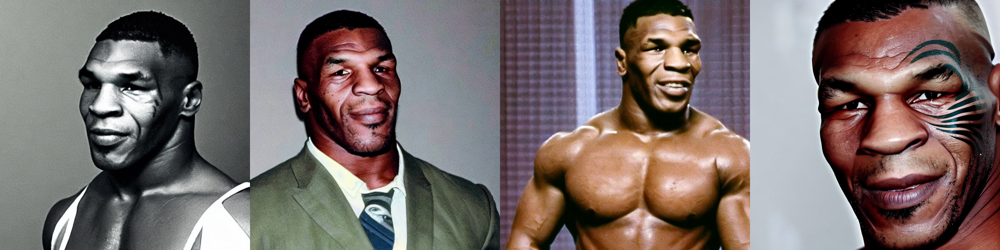

In [93]:
orig_canvas

In [142]:
eig_idx = 3
eig_scale = 16.0

new_lora_vec = orig_lora_vec.clone() / 0.0152
with torch.no_grad():
    mean, logvar = lora_vae.encoder(new_lora_vec)
    mean = mean + eigvecs[:, eig_idx] * eig_scale
    new_lora_vec = lora_vae.decoder(mean)

new_lora_vec = new_lora_vec * 0.0152

state_dict_new = recover_lora(new_lora_vec, weight_dict)
state_dict_new = convert_to_multi(state_dict_new, idx=0)

In [143]:
missing, unexpected = pipe.unet.load_state_dict(state_dict_new, strict=False)
missing, unexpected = pipe.text_encoder.load_state_dict(state_dict_new, strict=False)
pipe = pipe.to("cuda", torch.float16)

In [144]:
torch.manual_seed(seed)
images = pipe(["a photo of a sks person"]*4, height=640, width=640, num_inference_steps=30).images

100%|██████████| 30/30 [00:05<00:00,  5.22it/s]


In [145]:
canvas = Image.new('RGB', (640*4, 640))
for i, image in enumerate(images):
    canvas.paste(image, (640*i, 0))

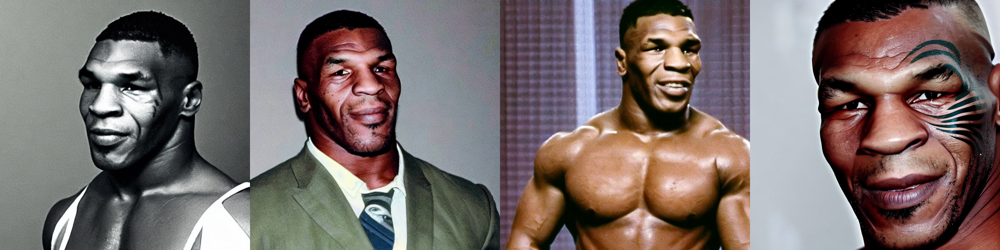

In [146]:
orig_canvas

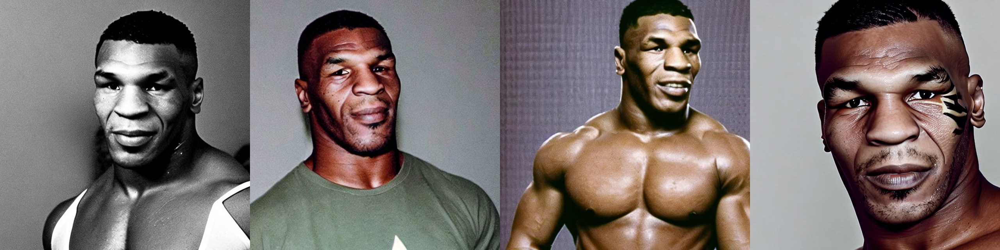

In [147]:
canvas